# Machine Learning Models to Predict Year End Rankings of ATP Players
---
The goal of this notebook is to build supervised machine learning model(s) that can predict the year end ranking of ATP Players based on their serve and return stats. I want to know if it is possible to place them accurately without knowing how many matches or tournaments they've won. In other words, do stats tell the full story or do some players have something a little less tangible that takes them to the top?

I will first build a base Random Forest Classifier to place players in 4 distinct ranking categories - top 10, top 32, top 100 and >100. I will then aim to improve the model using hyperparameter tuning techniques, then use the final model to make predictions for the 2022 season and evaluate its performance using the official year end rankings. Finally, I will build a Random Forest Regressor to predict a players year end ranking points, sort them and compare them to the actual rankings.

---
<br><br>

### Import Modules, Data and Deal With Missing Values
---
Of the columns I am interested in, the only missing values are for a few players in the tie break win percentage field - likely because they did not play a tiebreak in any of their matches. To account for this and not simply lose their data, I decided to fill those missing values with the mean of all the other players, which is just under 50% for the players in this dataset.

In [1]:
import pandas as pd
pd.options.display.max_columns = None
pd.options.display.max_rows = None

import numpy as np

import seaborn as sns
from matplotlib import pyplot as plt
plt.style.use('Solarize_Light2')
sns.set_palette('colorblind')

from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.metrics import confusion_matrix, classification_report


In [2]:
# Only include players with 5 matches with stats in each season
players_by_year = pd.read_csv('players_by_year.csv', index_col=[0])\
                .query('matches_w_stats > 5')  

players_by_year.year_end_ranking_cat = pd.Categorical(
    players_by_year.year_end_ranking_cat,
    categories=['>100', 'top100', 'top32', 'top10'],
    ordered=True)

# Fill missing tie break data with mean of column
players_by_year.tb_win_pct.fillna(players_by_year.tb_win_pct.mean(), 
                                  inplace=True)

### Create Train/Test and Hold Out Sets
---
1991 - 2021 data will be used to train and test models for a year-end ranking classifier. Because of ranking point changes in 2009, 2009-2021 data will be used as the training and test data for the year end points regression model. Finally, 2022 data will be used as a hold out set to test the models performance and make predictions for the 2022 season. 

In [26]:
# Train/test dataset for year-end ranking classification problem
player_data = players_by_year.query('year <= 2021')  

In [27]:
# Train/test dataset for year-end ranking points regression problem
players_2009_2021 = players_by_year.query("2009 <= year <= 2021") 

In [28]:
# Hold out set for evaluation model performance and making predictions
players_2022 = players_by_year.query("year == 2022")

### Adding Additional Features
---
As well as looking at each players basic serve and return stats, I want to help refine the model's performance by adding in two additional features from the dataset - tourney_plyd, the number of tournaments a player had entered over the course of a season, and avg_opponent_ranking, the average ranking of opponent a player has played against over their season. The reason for this is because I don'd want the model to inflate the ranking of players who have performed very well, but against lower ranked opposition, or for only a few matches in the year.

In [6]:
features = ['aces_per_game', 'df_per_game', 'bp_per_game',
            'bp_faced_per_game','1st_pct', '1st_win_pct', 
            '2nd_win_pct', '1st_return_win_pct', '2nd_return_win_pct',
            'bp_conversion_rate', 'bp_saved_rate','tb_win_pct',
            'avg_opponent_rank', 'tourney_plyd']

target = ['year_end_ranking_cat']


df = player_data[features + target]

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5323 entries, 0 to 6504
Data columns (total 15 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   aces_per_game         5323 non-null   float64 
 1   df_per_game           5323 non-null   float64 
 2   bp_per_game           5323 non-null   float64 
 3   bp_faced_per_game     5323 non-null   float64 
 4   1st_pct               5323 non-null   float64 
 5   1st_win_pct           5323 non-null   float64 
 6   2nd_win_pct           5323 non-null   float64 
 7   1st_return_win_pct    5323 non-null   float64 
 8   2nd_return_win_pct    5323 non-null   float64 
 9   bp_conversion_rate    5323 non-null   float64 
 10  bp_saved_rate         5323 non-null   float64 
 11  tb_win_pct            5323 non-null   float64 
 12  avg_opponent_rank     5323 non-null   float64 
 13  tourney_plyd          5323 non-null   int64   
 14  year_end_ranking_cat  5323 non-null   category
dtypes: c

### Inspecting Player Rankings Distribution and How Features Relate To Each Other
---

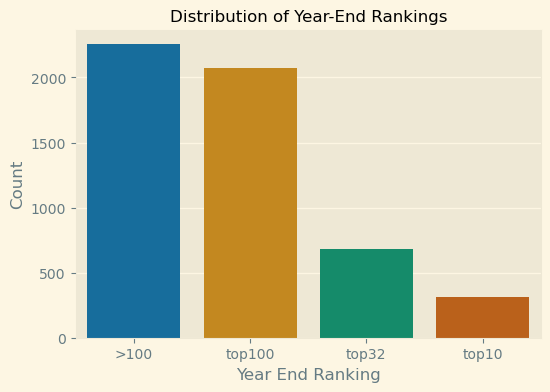

<Figure size 640x480 with 0 Axes>

In [8]:
fig1 = plt.figure(figsize=(6, 4))
ranking_distribution = df.year_end_ranking_cat.value_counts()
sns.barplot(x=ranking_distribution.index, y=ranking_distribution.values)
plt.xlabel('Year End Ranking')
plt.ylabel('Count')
plt.title('Distribution of Year-End Rankings', fontsize=12)
plt.show()
plt.clf()

The goal of the notebook is to build a classifier that will predict year end rankings of players. Because the classes I aim to predict are imbalanced, it will be important to consider that when building the classifier.

### Pair Plot and Correlation Heat Map of Features
---

To get an idea of how the features are related to one another, I will also produce a pair plot and correlation heat map of the features to get a feel for the data. Because the random forest is robust to non-normally distributed data and multicollinearity, it is not essential for each feature to be normally distributed, but it again may be useful if alternative models are used in the future, or for future feature selection.

<Figure size 2000x2000 with 0 Axes>

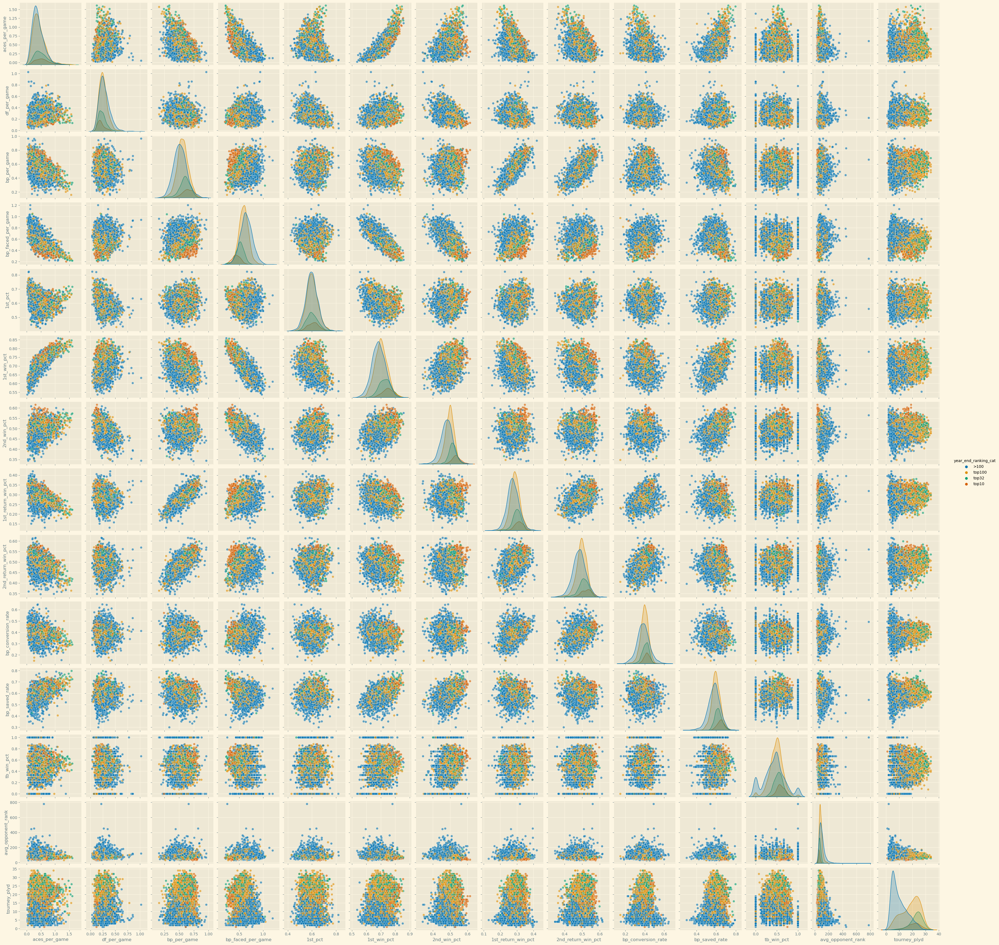

<Figure size 640x480 with 0 Axes>

In [9]:
fig1 = plt.figure(figsize=(20, 20))

sns.pairplot(df[features + ['year_end_ranking_cat']],
             hue='year_end_ranking_cat',
             plot_kws={'alpha':0.6})
plt.show()
plt.clf()

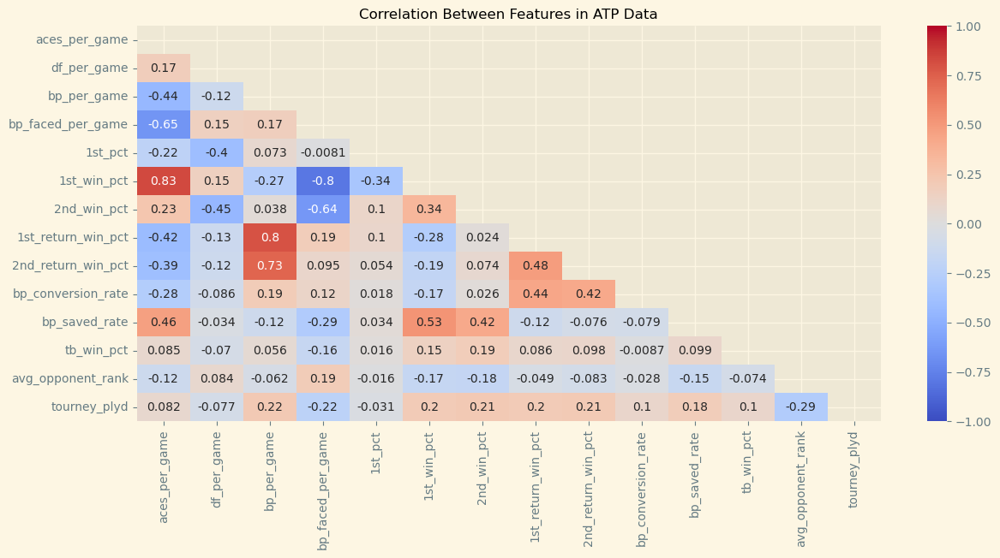

In [10]:
fig2 = plt.figure(figsize=(14,6))
corr = df[features].corr()
mask = np.triu(corr)
sns.heatmap(corr, annot=True, mask=mask, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Between Features in ATP Data', fontsize=12)
plt.show()

From the pair plot and correlation plots above, we can see that most of the features in the model are roughly normally distributed amongst each distinct ranking category bar a couple of features, namely average_opponent_rank and tb_win_pct. The distribution of average_opponent_rank is highly right skewed and therefore for future models, it may be worth performing a log transformation on this feature. The peaks at 0 and 1 for tb_win_percentage are mainly made up of lower ranked players who have likely played very few tiebreaks with an either 100% or 0% win record - to smooth out this feature it may be worth only considering players who have played a larger amount of matches, remove the >100 category of players altogether, replace the 0 and 1 values with the median value of the feature, or remove it entirely from the dataset.

For models which require little to no multicollinearity, it may be worth considering the strong correlations between some of the features in this dataset, namely the strong correlation between 1st_win_pct and aces per game, bp_faced_per game and between 1st_return_win_pct and bp_per_game. To do this we may consider using a method like calculating the variance inflation factor (VIF) for each feature in a regression model, then removing the feature with the lowest impact from the regression coefficients.

# Building a Random Forest Classifier To Predict Year-End-Ranking Category
---
I will first build a base Random Forest Classifier to predict the year end ranking category of players (>100, top100, top32, top10), and evaluate its performance using a test set.

### Building a Base Random Forest Classifier
---

In [11]:
X = df[features]
y = df.year_end_ranking_cat.cat.codes  

# Stratify X and y such that they have the same proportion of each category
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    random_state=0,
                                                    stratify=y)  

In [12]:
rf = RandomForestClassifier(class_weight='balanced', random_state=0)
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)
test_score = rf.score(X_test, y_test)
train_score = rf.score(X_train, y_train)
print(f'Accuracy of base Random Forest (train): {train_score:.3f}')
print(f'Accuracy of base Random Forest (test): {test_score:.3f}')

Accuracy of base Random Forest (train): 1.000
Accuracy of base Random Forest (test): 0.713


In [13]:
report = classification_report(y_test, y_pred)
print(report)

              precision    recall  f1-score   support

           0       0.77      0.85      0.81       564
           1       0.67      0.67      0.67       518
           2       0.57      0.45      0.50       171
           3       0.80      0.62      0.70        78

    accuracy                           0.71      1331
   macro avg       0.70      0.65      0.67      1331
weighted avg       0.71      0.71      0.71      1331



### Improving the Random Forest Classifier with Hyperparameter Tuning (Random Search CV)
---
I will now use Random Search CV to try and improve the performance of the classifier by tuning its Hyperparameters then compare its performance to the base classifier. 


In [14]:
rf = RandomForestClassifier(class_weight='balanced', random_state=0)

In [15]:
n_estimators = [int(x) for x in np.linspace(100, 1000, 20)]
max_depth = [int(x) for x in np.linspace(5, 25, 20)]
max_depth.append(None)
min_samples_split = [2, 3, 4]
min_samples_leaf = [1, 2]

random_grid = {'n_estimators': n_estimators,
              'max_depth': max_depth,
              'min_samples_split': min_samples_split,
              'min_samples_leaf': min_samples_leaf
              }

In [16]:
rf_random = RandomizedSearchCV(estimator=rf, 
                               param_distributions=random_grid,
                               n_iter=50, 
                               cv=3,
                               random_state=0)
rf_random.fit(X_train, y_train)

RandomizedSearchCV(cv=3,
                   estimator=RandomForestClassifier(class_weight='balanced',
                                                    random_state=0),
                   n_iter=50,
                   param_distributions={'max_depth': [5, 6, 7, 8, 9, 10, 11, 12,
                                                      13, 14, 15, 16, 17, 18,
                                                      19, 20, 21, 22, 23, 25,
                                                      None],
                                        'min_samples_leaf': [1, 2],
                                        'min_samples_split': [2, 3, 4],
                                        'n_estimators': [100, 147, 194, 242,
                                                         289, 336, 384, 431,
                                                         478, 526, 573, 621,
                                                         668, 715, 763, 810,
                                                         857, 905, 952, 1000]},
                   random_state=0)

In [17]:
best_random_params = rf_random.best_params_
best_random_params

{'n_estimators': 763,
 'min_samples_split': 3,
 'min_samples_leaf': 2,
 'max_depth': 14}

In [18]:
train_score = rf_random.best_estimator_.score(X_train, y_train)
test_score = rf_random.best_estimator_.score(X_test, y_test)

print('Accuracy of Random Forest after Random Search CV (train):'\
      f'{train_score:.3f}')

print('Accuracy of Random Forest after Random Search CV (test):'\
      f'{test_score:.3f}') 

Accuracy of Random Forest after Random Search CV (train):0.988
Accuracy of Random Forest after Random Search CV (test):0.730


RandomSearch CV yielded around a 2% accuracy improvement compared to the base classifier when used on test data. Accuracy on training data remained very high at 98.8%, suggesting the model may still be highly prone to over-fitting, a common issue with random forests.

### Using Results of Random Search To Build Best Random Forest Classifier
---

In [19]:
best_rf = RandomForestClassifier(random_state=0, 
                                 class_weight='balanced',
                                 n_estimators=763,
                                 min_samples_leaf=2,
                                 min_samples_split=3,
                                 max_depth=14)
best_rf.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced', max_depth=14,
                       min_samples_leaf=2, min_samples_split=3,
                       n_estimators=763, random_state=0)

In [20]:
y_pred = best_rf.predict(X_test)

report_best = classification_report(y_test, y_pred)
confusion_best = confusion_matrix(y_test, y_pred)
feature_importance = pd.DataFrame({'features': features, 
                                   'importance': best_rf.feature_importances_
                                   }).sort_values('importance', ascending=False)

              precision    recall  f1-score   support

           0       0.78      0.85      0.81       564
           1       0.70      0.66      0.68       518
           2       0.62      0.57      0.59       171
           3       0.80      0.65      0.72        78

    accuracy                           0.73      1331
   macro avg       0.72      0.68      0.70      1331
weighted avg       0.73      0.73      0.73      1331



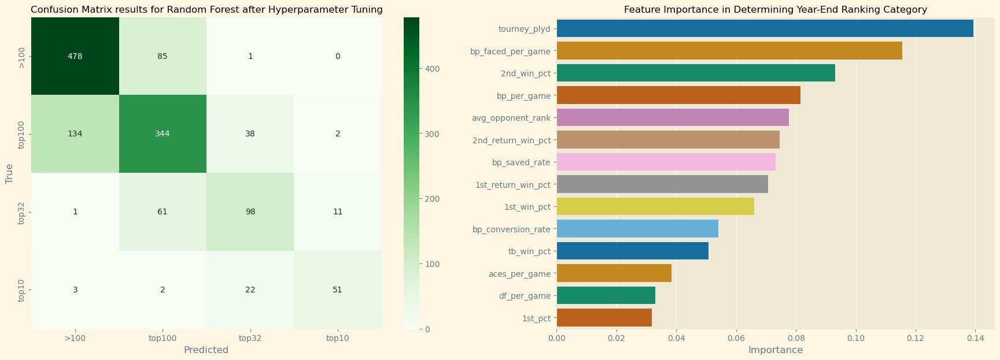

<Figure size 640x480 with 0 Axes>

In [21]:
print(report_best)
plt.figure(figsize=(18, 7))

ax = plt.subplot(1,2,1)
sns.heatmap(confusion_best, annot=True, fmt='g', cmap='Greens')
ax.xaxis.set_ticklabels(df.year_end_ranking_cat.cat.categories)
ax.yaxis.set_ticklabels(df.year_end_ranking_cat.cat.categories)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix results for Random Forest'\
          ' after Hyperparameter Tuning', fontsize=12)

ax2 =plt.subplot(1, 2, 2)
sns.barplot(y=feature_importance.features, x=feature_importance.importance,
            palette='colorblind')
plt.title('Feature Importance in Determining Year-End Ranking Category',
          fontsize=12)
plt.ylabel(None)
plt.xlabel('Importance')

plt.subplots_adjust(right=1.05)
plt.show()
plt.clf()

### Feature Importance Discussion
---

Unsurprisingly tourney_plyd is the most dominant feature in the random forest classifier, but I did feel this was a necessary feature to help eliminate players who performed well but over a small number of matches without giving too much away. Like in the simple linear regression in the previous notebook, 1st serve percentage, aces per game and double faults per game were not important compared to other features and could be removed to improve efficiency whilst maintaining performance. Break point save and conversion rates are also much less important than the number of break points earned and faced meaning it is far more important to a players performance to generate as many opportunities as possible, rather than how well you do at taking them.

Recall, Accuracy, Precision and F1 score were significantly lower in the top32 category compared to the >100 and top10 categories, suggesting that this is the most difficult area of the rankings to predict. With a low sample size compared to top100 and >100, but without the strong, perhaps clearer statistical advantages of the top10, this is not very surprising.

Of the basic serving stats, break points faced per game, 2nd serve win percentage and 2nd serve return win percentage were the most important. This confirms my thoughts prior to doing the analysis that during a second serve point, the players start on far more neutral terms. The better players are more likely to come out on top in the neutral points and therefore more likely to win the match. A player who faces many break points per game, even if they save a lot of them, will likely succumb to being broken eventually, making it difficult to win sets and matches.

### Testing Random Forest on 2022 Data and Comparing Results to Official Year End Rankings
---

In [30]:
players_2022_df = players_2022[features + target]

              precision    recall  f1-score   support

           0       0.79      0.85      0.81        65
           1       0.72      0.66      0.69        67
           2       0.57      0.59      0.58        22
           3       0.70      0.70      0.70        10

    accuracy                           0.73       164
   macro avg       0.69      0.70      0.70       164
weighted avg       0.72      0.73      0.72       164



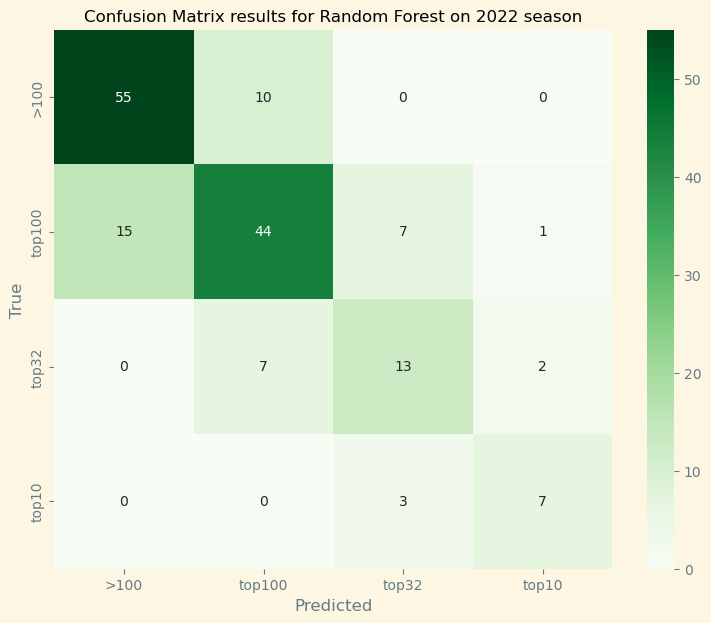

<Figure size 640x480 with 0 Axes>

In [31]:
X_2022 = players_2022_df[features]
y_2022 = players_2022_df.year_end_ranking_cat.cat.codes

y_pred_2022 = best_rf.predict(X_2022)
probas_2022 = best_rf.predict_proba(X_2022)

score_2022 = classification_report(y_2022, y_pred_2022)
confusion_2022 = confusion_matrix(y_2022, y_pred_2022)

print(score_2022)

plt.figure(figsize=(9, 7))
ax = plt.subplot()
sns.heatmap(confusion_2022, annot=True, fmt='g', cmap='Greens')

ax.xaxis.set_ticklabels(df.year_end_ranking_cat.cat.categories)
ax.yaxis.set_ticklabels(df.year_end_ranking_cat.cat.categories)

plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix results for Random Forest on 2022 season',
          fontsize=12)
plt.show()
plt.clf()

In [32]:
year_end_2022 = players_2022[features + target + ['name', 'year_end_ranking']]\
                            .dropna()
year_end_2022['predicted_cat'] = y_pred_2022
year_end_2022['actual_cat'] = year_end_2022.year_end_ranking_cat.cat.codes

for i in range(4):
    cats = ['>100', 'top100', 'top32', 'top10']
    year_end_2022[f'proba_{cats[i]}'] = probas_2022[:,i].round(2)

year_end_2022 = year_end_2022[['name', 'year_end_ranking', 'actual_cat',
                               'predicted_cat', 'proba_top10', 'proba_top32',
                               'proba_top100', 'proba_>100']]


year_end_2022['correct'] = year_end_2022.apply(
    lambda x: 1 if x.actual_cat == x.predicted_cat else 0,
    axis=1)

# Convert category codes back into strings.
year_end_2022['actual_cat'] = year_end_2022.actual_cat.apply(
    lambda x: ['>100', 'top100', 'top32', 'top10'][x])  

year_end_2022['predicted_cat'] = year_end_2022.predicted_cat.apply(
    lambda x: ['>100', 'top100', 'top32', 'top10'][x])

year_end_2022.sort_values('year_end_ranking', ascending=True)\
             .reset_index(drop=True)\
             .set_index('name')\
             .head(32)

,year_end_ranking,actual_cat,predicted_cat,proba_top10,proba_top32,proba_top100,proba_>100,correct
name,,,,,,,,
Carlos Alcaraz,1,top10,top10,0.94,0.04,0.02,0.00,1
Rafael Nadal,2,top10,top10,0.68,0.24,0.07,0.02,1
Casper Ruud,3,top10,top32,0.45,0.47,0.08,0.01,0
Stefanos Tsitsipas,4,top10,top10,0.50,0.46,0.03,0.01,1
Novak Djokovic,5,top10,top10,0.89,0.08,0.02,0.01,1
Felix Auger Aliassime,6,top10,top32,0.25,0.62,0.11,0.02,0
Daniil Medvedev,7,top10,top10,0.66,0.30,0.04,0.01,1
Andrey Rublev,8,top10,top10,0.52,0.40,0.07,0.01,1
Taylor Fritz,9,top10,top10,0.46,0.45,0.08,0.01,1


## Conclusion - Year-End-Ranking Category Classifier
---
From the results of the Random Forest Classifier we can see that it achieved around 73% accuracy in predicting year end ranking category. It was particularly successful in predicting >100 ranked players and top 10 players with an 85% and 70% recall score respectfully in those categories. The weakest and therefore hardest category to predict was the top 32 player category. This perhaps is not entirely unsurprising as there is a small sample size for this group, however unlike top 10 players, there is less separation between them and the rest of the tour - the top 32 are far less established and are prone to change. Despite being only 22 ranking spots between 11th and 32nd, this also corresponds to a large difference in level, and thus is probably why this group of players is hard to place on service and return stats alone.

There are also other reasons for the 2022 being particularly hard to predict. Because of the war in Ukraine, Russian and Belarusian players were banned from competing at the 2022 Wimbledon Championships and as a result, the ATP decided to not award points to players who competed at the tournament. The result of this was that players who did well at Wimbledon were penalised and their performance is not reflected in the year end rankings. This will also have a big effect on the coming predictions of ATP points in my next model.

Because the model is built from stats aggregated across the entire year, it is very likely to reward consistency rather than short bursts of form. For example, 2 of the 3 misclassified top 10 players, Felix Auger-Aliassime and Casper Ruud built their year-end-ranking from a small set of tournaments, doing extremely well in some but poorly in others. Because of this I think the model underrated their season performance. On the other hand, the model also overrated players that were consistent in their performances but maybe didn't quite put it together to perform well in the later stages or win tournaments. Roberto Bautista Agut and Jannik Sinner are perfect examples of this - both predicted to finish as top 10. Sinner performed at a high level for most of the year, meaning he had strong stats in all departments, however injuries and tight losses at big tournaments meant he missed out from getting any big results. RBA is considered one of the most consistent players on the tour, and has been a solid member of the top 20 for many years however rarely wins against the top players, only once winning above 250 level in his career.

Another notable misclassification in the top 32 is Borna Coric. Coric was making his way back from a slump in form and injuries in 2022, but out of nowhere won one of the biggest tournaments in the year at the Cincinnati Masters, propelling his ranking. He however did not continue this form for the rest of the season, so I understand why the model ranked him lower than expected.

It is clear from the results that a model based on serve and return stats alone will always struggle to perform at a very high accuracy when predicting ranking categories like these. There are too many nuances in the rankings that occur throughout the year - injuries, inconsistency and luck to name a few.

<br><br>
# Predicting Year End Rankings Using Random Forest Regressor
---
I now aim to predict the amount of points a player will gain during the 2022 season based on historical serve and return data. The main thing to note here is that before the 2009 ATP season, the points awarded for many tournament categories were changed significantly. For example winning a grand slam in 2008 would award 1000 points, in 2009 however it awards 2000 points. Because of this I am going to train my model on data post 2009 only in the hope that this produces more accurate points scores for the 2022 season - otherwise I would expect lower predicted values due to the lower points awarded pre 2009. Unfortunately there isn't a scale factor that can be used to multiply older points tallies as the changes did not affect all levels and stages of tournaments equally.

Another thing to note is that in 2020, a large portion of the season was cancelled due to the Covid-19 pandemic. Because of this, the year end rankings points were significantly lower than would be expected for a full season. The pandemic has also affected the 2021 season as some tournaments, like the Shanghai masters were still not played. For now I will keep the 2020 and 2021 seasons in the datasets.

After predicting the number of points each player should have I shall order them accordingly, essentially predicting the year end rankings, and compare them to the actual rankings they achieved in the 2022 season.

### Building a Base Random Forest Regressor
---

In [36]:
X = players_2009_2021[features]
y = players_2009_2021['year_end_points']

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

In [37]:
rfr = RandomForestRegressor(random_state=0)
rfr.fit(X_train, y_train)
y_pred = rfr.predict(X_test)
rfr_score = rfr.score(X_test, y_test)
print(f'Accuracy of base regressor: {rfr_score:.3f}')

Accuracy of base regressor: 0.786


### Improving Random Forest Regressor with Grid Search CV
---
Using similar hyperparameters to those found in the Random Forest Classifier, I will aim to improve the accuracy of the regressor using Grid Search CV.

In [38]:
n_estimators = [500, 700]
max_depth = [15, None]
min_samples_split = [3, 4]
min_samples_leaf = [1, 2]

param_grid = {'n_estimators': n_estimators,
              'max_depth': max_depth,
              'min_samples_split': min_samples_split,
              'min_samples_leaf': min_samples_leaf
              }

In [39]:
rfr = RandomForestRegressor(random_state=0)

rfr_grid = GridSearchCV(estimator = rfr, 
                        param_grid = param_grid,
                        cv = 3)
rfr_grid.fit(X_train, y_train)

GridSearchCV(cv=3, estimator=RandomForestRegressor(random_state=0),
             param_grid={'max_depth': [15, None], 'min_samples_leaf': [1, 2],
                         'min_samples_split': [3, 4],
                         'n_estimators': [500, 700]})

In [40]:
rfr_best_params = rfr_grid.best_params_
rfr_best_params

{'max_depth': None,
 'min_samples_leaf': 1,
 'min_samples_split': 3,
 'n_estimators': 700}

In [41]:
rfr_best = rfr_grid.best_estimator_
best_score = rfr_best.score(X_test, y_test)
y_pred = rfr_best.predict(X_test)
rfr_best_score = rfr_best.score(X_test, y_test)

print('Accuracy of regressor after Hyperparameter tuning: '\
       f'{rfr_best_score:.3f}')

Accuracy of regressor after Hyperparameter tuning: 0.788


Accuracy of regressor increased by 0.02 after tuning, relatively insignificant.

### Visualising Performance of Random Forest Regressor on Test Data
---
Included a log representation of year end points to better visualise large cluster of players between 0 and 2000 points

In [42]:
rfr_feature_importances = pd.DataFrame({'feature': features,
                                'importance': rfr_best.feature_importances_})\
                            .sort_values('importance', ascending=False)\
                            .reset_index(drop=True)

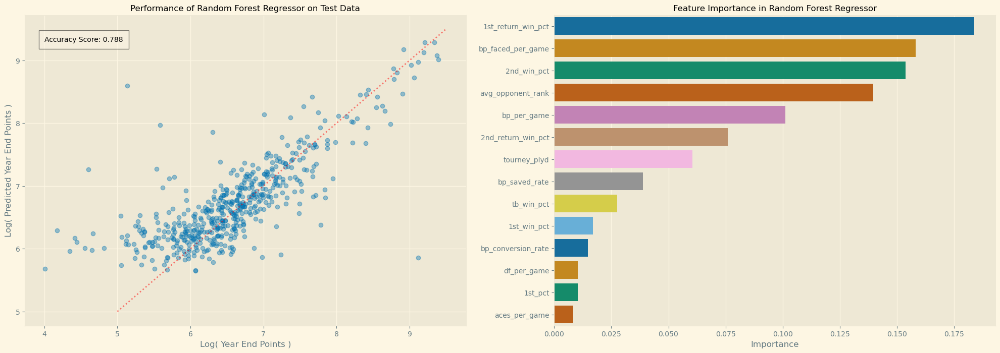

In [43]:
fig = plt.figure(figsize=(12,8))

plt.subplot(1,3,2)
plt.scatter(np.log(y_test), np.log(y_pred), alpha=.4)
plt.plot([5, 9.5], [5, 9.5], linestyle='dotted', c='r', alpha=.5)
plt.ylabel('Log( Predicted Year End Points )')
plt.xlabel('Log( Year End Points )')
plt.title('Performance of Random Forest Regressor on Test Data', fontsize=12)
plt.text(4, 9.3, f'Accuracy Score: {rfr_best_score:.3f}',
         bbox = {'facecolor': 'oldlace', 'alpha': 0.5, 'pad': 8})

plt.subplot(1, 3, 3)
sns.barplot(data=rfr_feature_importances, x='importance', y='feature',
            palette='colorblind')
plt.xlabel('Importance')
plt.ylabel(None)
plt.title('Feature Importance in Random Forest Regressor', fontsize=12)

plt.subplots_adjust(right=2.6)
plt.show()

### Comparing 2022 Top 32 Player's Year End Rankings to Their Model Predicted Rankings
---

In [47]:
df_2022 = players_2022.query('matches_plyd > 10')
df_2022 = df_2022[features + ['year_end_points', 'name','year_end_ranking']].dropna()
X_2022 = df_2022[features]
y_2022 = df_2022['year_end_points']

high_pts_2022 = rfr_best.predict(X_2022)
df_2022['predicted_points'] = high_pts_2022

year_end_2022 = df_2022[['name', 'predicted_points',
                         'year_end_points', 'year_end_ranking']]\
                        .sort_values('year_end_ranking')\
                        .head(32)\
                        .sort_values('predicted_points', ascending=False)\
                        .reset_index(drop=True)

year_end_2022['predicted_ranking'] = year_end_2022.index + 1
year_end_2022.set_index('name', inplace=True)

year_end_2022['change'] = (year_end_2022['year_end_ranking']
                           - year_end_2022['predicted_ranking'])

year_end_2022

,predicted_points,year_end_points,year_end_ranking,predicted_ranking,change
name,,,,,
Novak Djokovic,8417.859779,4820.0,5,1,4
Carlos Alcaraz,6754.920741,6820.0,1,2,-1
Rafael Nadal,5583.815721,6020.0,2,3,-1
Daniil Medvedev,4971.968170,4065.0,7,4,3
Alexander Zverev,4555.698112,2700.0,12,5,7
Jannik Sinner,4472.318745,2410.0,15,6,9
Roberto Bautista Agut,3836.893429,1940.0,21,7,14
Andrey Rublev,3623.000490,3930.0,8,8,0
Felix Auger Aliassime,3342.381980,4195.0,6,9,-3


### Visualising Year End Rankings vs Predicted Rankings
---

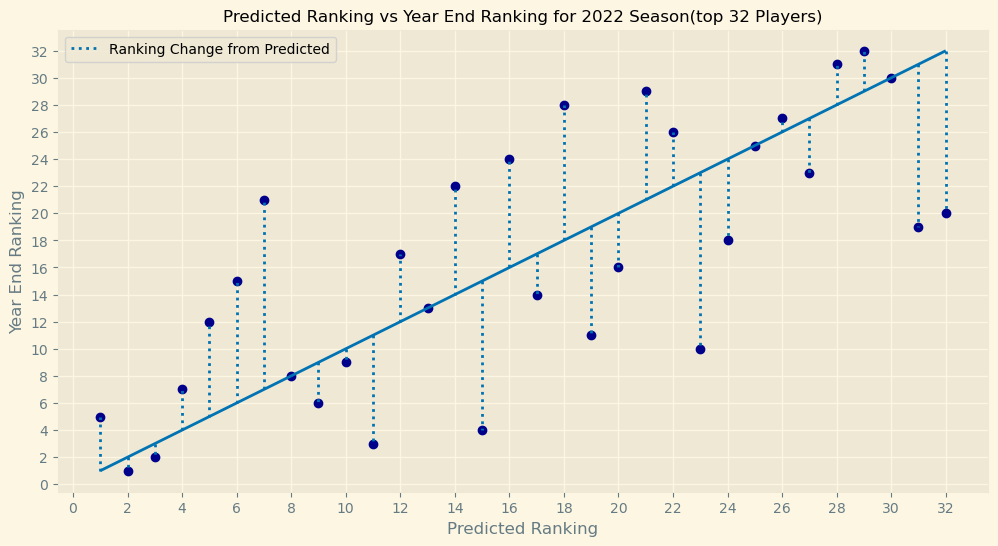

<Figure size 640x480 with 0 Axes>

In [48]:
plt.figure(figsize=(12,6))

plt.plot(range(1,33), range(1,33))
plt.scatter(year_end_2022.predicted_ranking, year_end_2022.year_end_ranking,
            color='darkblue')

# Add residuals to plot
plt.vlines(x = year_end_2022.predicted_ranking,
           ymin = range(1, 33),
           ymax = range(1, 33) + year_end_2022.change,
           linestyles='dotted', label='Ranking Change from Predicted')

plt.xlabel('Predicted Ranking')
plt.ylabel('Year End Ranking')
plt.legend()
plt.xticks(range(0, 33, 2))
plt.yticks(range(0, 33, 2))
plt.title('Predicted Ranking vs Year End Ranking for 2022 Season'\
          '(top 32 Players)', fontsize=12)

plt.show()
plt.clf( )

## Conclusion - Predicting 2022 Year End Rankings Using Random Forest Regressor
---
As discussed earlier, the 2022 season was affected massively by outside events, namely the lack of points awarded for the 2022 Wimbledon Championships. In addition to this, the other event(s) that significantly effected the top of the rankings was Novak Djokovic's absence from many of the top tournaments due to his covid-19 vaccination status - Djokovic was deported from Australia prior to the first grand slam of the season where he was defending champion, and was also barred from entry into the United States, therefore missing the US Open as well as 4 of the 8 masters events of 2022. Despite not ending the year ranked number 1, it is widely accepted in the tennis community that had Djokovic been awarded points for winning Wimbledon in 2022, and certainly if he were not banned in Australia and the US Open, that he was the best player in 2022 and this is reflected in his stats and by the model.

Another player with a relatively big ranking disparity in the top 10 was Alexander Zverev. One of the best early performers in 2022, Zverev suffered a nearly career ending injury in the semi finals of the French Open, and did not play the second half of the season. Had he not been injured and maintained his form, there is no doubt that he would have finished higher in the rankings, closer to the prediction of the model.

Again, Roberto Bautista Agut has been favoured by the regressor, and has the biggest differential between predicted and actual ranking. I believe his consistent performances throughout the season, regardless of who he plays is why the model sees him so favourably. On the other hand, Stefanos Tsitsipas seemed to over-perform compared to his stats, and was actually the tour leader in match wins in 2022 - this confirms to me that although stats can certainly show part of the story in determining who will have the best year, there is definitely something less tangible that ultimately defines success.

In hindsight 2022 was not the most suitable validation set for either model due to the unusual circumstances that surrounded the season. At the conclusion of the 2022 season it would be interesting to see how the model performs on a complete set of data which is properly reflective of players performances. Although, injuries and inconsistency will always mean the model will be imperfect.

<br>

## Future Improvements
---
- Create a data pipeline that automatically downloads match data as it is uploaded. Currently ATP data is downloaded and stored locally.
- Create a different model e.g. SVM regressor and compare performance to Random Forrest Regressor
- Use models to predict year end rankings for 2023 season as it becomes available and add 2022 data to training and testing sets
- Improve method of dealing with missing data, possibly an iterative imputer rather than using the mean 
- Add more of the available features to the model to increase performance i.e. more than serve and return stats to see how well a model can work with all available information
- Perform sequential feature selection or regularisation to see if performance can be maintained but decrease computation time
- Add features which separate stats based on surface (Grass, Clay, Hard)
- Add more features to see maximum potential of using season statistics to predict year end rankings including match wins, match win percentage, titles, finals, win rate against top players etc.
- Use principle component analysis to maintain efficiency with more features being added

---